
# AI profiling (Discogs MAEST)

Outputs:
- Fine-grained Discogs posterior (top-k)
- Macro style bucket (`style_profile`)
- Confidence proxies (entropy, margin)
- Version trace + model revision (commit SHA)


✅ Profile written: `/content/ai_profile_0.json`  

Top style (Discogs): **Hip Hop---Instrumental**  
Style profile (macro): **hiphop**  
Confidence: entropy_norm `0.322`, margin `0.210`

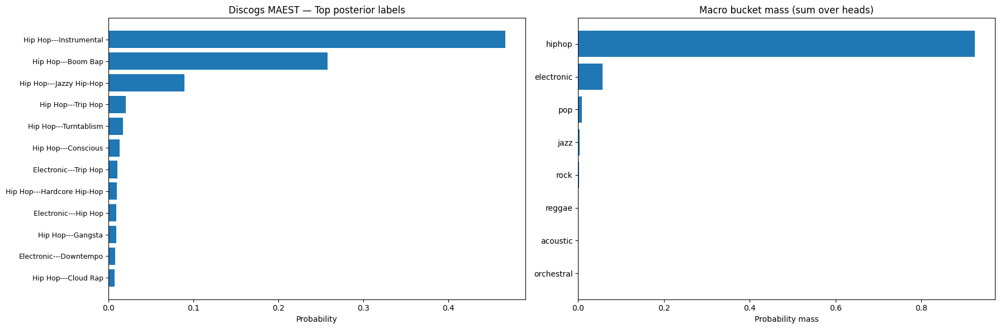

In [3]:
#@title AI Profiling (Discogs MAEST)

import os, sys, re, json, subprocess, warnings, logging
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
from scipy.signal import resample_poly
from IPython.display import display, Markdown

warnings.filterwarnings("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["HF_HUB_DISABLE_PROGRESS_BARS"] = "1"
os.environ["HF_HUB_DISABLE_TELEMETRY"] = "1"
os.environ["TRANSFORMERS_NO_ADVISORY_WARNINGS"] = "1"

logging.getLogger("transformers").setLevel(logging.ERROR)
try:
    from transformers.utils import logging as hf_logging
    hf_logging.set_verbosity_error()
except Exception:
    pass

# ============================================================
# User parameters
# ============================================================
INPUT_PATH = "/content/audiosr_0.wav"  # @param {"type":"string"}

# ============================================================
# Helpers
# ============================================================
def _run_quiet(cmd, check=True):
    return subprocess.run(cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=check)

def _pip_quiet(args, check=True):
    return _run_quiet([sys.executable, "-m", "pip"] + args, check=check)

def _ensure_stack():
    try:
        import torch
        from transformers import AutoProcessor, AutoModelForAudioClassification
        from huggingface_hub import model_info
        return
    except Exception:
        _pip_quiet(["install", "-q", "transformers", "accelerate", "safetensors",
                    "huggingface_hub", "einops", "timm"], check=True)
        import torch
        from transformers import AutoProcessor, AutoModelForAudioClassification
        from huggingface_hub import model_info

def _extract_tag(path: str) -> str:
    base = os.path.basename(path)
    m = re.search(r"_(\d+)(?=\.[Ww][Aa][Vv]$)", base)
    return f"_{m.group(1)}" if m else ""

def _sanitize(x: np.ndarray) -> np.ndarray:
    return np.nan_to_num(np.asarray(x, dtype=np.float32),
                         nan=0.0, posinf=0.0, neginf=0.0).astype(np.float32, copy=False)

def _resample_mono(x: np.ndarray, orig_sr: int, target_sr: int) -> np.ndarray:
    x = _sanitize(x)
    if int(orig_sr) == int(target_sr):
        return x
    g = int(np.gcd(int(orig_sr), int(target_sr)))
    up = int(target_sr // g)
    down = int(orig_sr // g)
    y = resample_poly(x, up, down, window=("kaiser", 5.0)).astype(np.float32, copy=False)
    return _sanitize(y)

def _package_versions():
    import importlib
    pkgs = ["numpy", "soundfile", "scipy", "torch", "transformers", "huggingface_hub"]
    out = {}
    for p in pkgs:
        try:
            m = importlib.import_module(p)
            out[p] = getattr(m, "__version__", "unknown")
        except Exception:
            out[p] = None
    return out

def _select_segments(x: np.ndarray, sr: int, seg_sec: float, k_energy: int = 3):
    n = len(x)
    seg_len = int(round(seg_sec * sr))
    if n <= seg_len:
        return [x], [0], seg_len

    hop = max(1, seg_len // 4)
    starts = list(range(0, n - seg_len + 1, hop))

    energies = []
    for s in starts:
        seg = x[s:s + seg_len]
        energies.append(float(np.mean(seg.astype(np.float64) ** 2)))

    order = np.argsort(energies)[::-1]
    picked = []
    min_sep = seg_len // 2
    for idx in order:
        s = starts[int(idx)]
        if all(abs(s - ps) > min_sep for ps in picked):
            picked.append(s)
        if len(picked) >= int(k_energy):
            break

    coverage = []
    for frac in [0.15, 0.50, 0.85]:
        mid = int(round(frac * n))
        s = int(np.clip(mid - seg_len // 2, 0, n - seg_len))
        coverage.append(s)

    all_starts = []
    for s in picked + coverage:
        if all(abs(s - a) > seg_len // 8 for a in all_starts):
            all_starts.append(int(s))

    segs = [x[s:s + seg_len] for s in all_starts]
    return segs, all_starts, seg_len

def _pad_or_crop(seg: np.ndarray, seg_len: int) -> np.ndarray:
    seg = _sanitize(seg)
    if len(seg) == seg_len:
        return seg
    if len(seg) > seg_len:
        return seg[:seg_len]
    out = np.zeros(seg_len, dtype=np.float32)
    out[:len(seg)] = seg
    return out

def _macro_bucket(head: str) -> str:
    h = head.strip().lower()
    mapping = {
        "hip hop": "hiphop",
        "electronic": "electronic",
        "rock": "rock",
        "pop": "pop",
        "jazz": "jazz",
        "classical": "classical",
        "reggae": "reggae",
        "folk, world, & country": "acoustic",
        "stage & screen": "orchestral",
        "blues": "acoustic",
        "funk / soul": "pop",
        "latin": "pop",
        "non-music": "general",
    }
    return mapping.get(h, "general")

# ============================================================
# Setup
# ============================================================
if not os.path.exists(INPUT_PATH):
    raise FileNotFoundError(f"Input file not found: {INPUT_PATH}")

TAG = _extract_tag(INPUT_PATH)
PROFILE_PATH = f"/content/ai_profile{TAG}.json"

display(Markdown(r"""
# AI profiling (Discogs MAEST)

Outputs:
- Fine-grained Discogs posterior (top-k)
- Macro style bucket (`style_profile`)
- Confidence proxies (entropy, margin)
- Version trace + model revision (commit SHA)
"""))

_ensure_stack()

import torch
from huggingface_hub import model_info
from transformers import AutoProcessor, AutoModelForAudioClassification

# ============================ robust CUDA probe ============================
def _cuda_usable():
    try:

        if (getattr(torch.version, "cuda", None) is None) or (not hasattr(torch._C, "_cuda_getDeviceCount")):
            return False

        if int(torch._C._cuda_getDeviceCount()) <= 0:
            return False

        _ = torch.empty(1, device="cuda")
        return True
    except Exception:
        return False

_CUDA_OK = bool(_cuda_usable())

# ============================ hard reset of previous patches ==============
# Make this cell safe even if a previous run monkey-patched .to/.cuda and left closures behind.
_TENSORBASE_TO = getattr(torch._C, "_TensorBase", None).to if hasattr(torch._C, "_TensorBase") else None

def _map_to_cpu(dev):
    try:
        if isinstance(dev, str) and dev.startswith("cuda"):
            return "cpu"
    except Exception:
        pass
    try:
        if isinstance(dev, torch.device) and dev.type == "cuda":
            return torch.device("cpu")
    except Exception:
        pass
    return dev

if _TENSORBASE_TO is not None:
    def _safe_tensor_to(self, *args, **kwargs):
        if not _CUDA_OK:
            if len(args) >= 1:
                a0 = _map_to_cpu(args[0])
                if a0 is not args[0]:
                    args = (a0,) + args[1:]
            if "device" in kwargs:
                kwargs["device"] = _map_to_cpu(kwargs["device"])
        return _TENSORBASE_TO(self, *args, **kwargs)

    def _safe_module_to(self, *args, **kwargs):
        if not _CUDA_OK:
            if len(args) >= 1:
                a0 = _map_to_cpu(args[0])
                if a0 is not args[0]:
                    args = (a0,) + args[1:]
            if "device" in kwargs:
                kwargs["device"] = _map_to_cpu(kwargs["device"])

        def _convert(t):
            if torch.is_tensor(t):
                return _TENSORBASE_TO(t, *args, **kwargs)
            return t

        return self._apply(_convert)

    try:
        torch.Tensor.to = _safe_tensor_to
    except Exception:
        pass
    try:
        torch.nn.Module.to = _safe_module_to
    except Exception:
        pass

    # make .cuda safe too
    def _safe_tensor_cuda(self, *args, **kwargs):
        if not _CUDA_OK:
            return self
        return _TENSORBASE_TO(self, "cuda")

    def _safe_module_cuda(self, *args, **kwargs):
        return self.to("cuda")

    try:
        torch.Tensor.cuda = _safe_tensor_cuda
    except Exception:
        pass
    try:
        torch.nn.Module.cuda = _safe_module_cuda
    except Exception:
        pass
# ===============================================================================

# Inference determinism knobs (best-effort; stable and harmless here)
torch.manual_seed(0)
np.random.seed(0)
try:
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
except Exception:
    pass

device = "cuda" if _CUDA_OK else "cpu"

MODEL_ID = "mtg-upf/discogs-maest-10s-pw-129e"

# ------------------------------------------------------------
# Revision locking:
# - If a prior profile exists, reuse its revision SHA.
# - Otherwise, resolve current hub revision SHA and lock to it.
# ------------------------------------------------------------
MODEL_REVISION = None
if os.path.exists(PROFILE_PATH):
    try:
        with open(PROFILE_PATH, "r", encoding="utf-8") as f:
            prev = json.load(f)
        if isinstance(prev, dict):
            MODEL_REVISION = prev.get("model_revision_sha", None)
    except Exception:
        MODEL_REVISION = None

if MODEL_REVISION is None:
    info = model_info(MODEL_ID)
    MODEL_REVISION = getattr(info, "sha", None)

if not isinstance(MODEL_REVISION, str) or len(MODEL_REVISION) < 8:
    raise RuntimeError("Could not resolve a valid model revision SHA for reproducible loading.")

processor = AutoProcessor.from_pretrained(MODEL_ID, trust_remote_code=True, revision=MODEL_REVISION)
model = AutoModelForAudioClassification.from_pretrained(MODEL_ID, trust_remote_code=True, revision=MODEL_REVISION)
model = model.to(device=device, dtype=torch.float32).eval()

# Infer expected SR
sr_model = None
for attr in ["sampling_rate", "sample_rate"]:
    if hasattr(processor, attr):
        sr_model = getattr(processor, attr)
        break
if sr_model is None and hasattr(processor, "feature_extractor") and hasattr(processor.feature_extractor, "sampling_rate"):
    sr_model = processor.feature_extractor.sampling_rate
sr_model = int(sr_model) if sr_model is not None else 16000

# Load audio (mono)
x, sr_in = sf.read(INPUT_PATH, always_2d=False)
x = np.mean(x, axis=1) if x.ndim > 1 else x
x = _sanitize(x)
sr_in = int(sr_in)

if x.shape[0] < int(0.25 * sr_in):
    raise RuntimeError("Input is too short for stable profiling.")

# Resample for inference only
x_inf = _resample_mono(x, sr_in, sr_model)

SEG_SEC = 10.0
segs, starts, seg_len = _select_segments(x_inf, sr_model, SEG_SEC, k_energy=3)
segs = [_pad_or_crop(s, seg_len) for s in segs]

# Inference (logit aggregation)
with torch.inference_mode():
    logits_sum = None
    for seg in segs:
        inp = processor(seg, sampling_rate=sr_model, return_tensors="pt")
        inp = {k: v.to(device=device) for k, v in inp.items()}
        for k in list(inp.keys()):
            if hasattr(inp[k], "dtype") and inp[k].dtype.is_floating_point:
                inp[k] = inp[k].to(dtype=torch.float32)

        out = model(**inp)
        logits = out.logits.squeeze(0).to(dtype=torch.float32)
        logits_sum = logits if logits_sum is None else (logits_sum + logits)

    logits_mean = logits_sum / float(len(segs))
    probs = torch.softmax(logits_mean, dim=-1).detach().cpu().numpy().astype(np.float64)
    probs = probs / max(float(np.sum(probs)), 1e-18)

id2label = model.config.id2label

topk = 12
idx = np.argsort(probs)[::-1][:topk]
top_labels = [(str(id2label[int(i)]), float(probs[int(i)])) for i in idx]

p_sorted = np.sort(probs)[::-1]
margin = float(p_sorted[0] - p_sorted[1]) if len(p_sorted) > 1 else float("nan")
entropy = float(-np.sum(probs * np.log(np.maximum(probs, 1e-12))))
entropy_norm = float(entropy / np.log(len(probs)))

# Macro fusion (probability mass over heads)
bucket_mass = {}
for i in range(len(probs)):
    lab = str(id2label[int(i)])
    head = lab.split("---", 1)[0]
    b = _macro_bucket(head)
    bucket_mass[b] = bucket_mass.get(b, 0.0) + float(probs[i])

bucket_sorted = sorted(bucket_mass.items(), key=lambda kv: kv[1], reverse=True)
macro_profile = bucket_sorted[0][0] if bucket_sorted else "general"
style_profile = macro_profile

top_style = top_labels[0][0] if top_labels else "unknown"

profile = {
    "input_path": INPUT_PATH,
    "tag": TAG,
    "model_id": MODEL_ID,
    "model_revision_sha": MODEL_REVISION,
    "device": device,
    "forced_dtype": "float32",
    "input_sr_hz": int(sr_in),
    "inference_sr_hz": int(sr_model),
    "segment_sec": float(SEG_SEC),
    "segments_used": int(len(segs)),
    "segment_starts_samples": [int(s) for s in starts],
    "top_style_discogs": top_style,
    "macro_profile": macro_profile,
    "style_profile": style_profile,
    "confidence": {"entropy_norm": float(entropy_norm), "margin": float(margin)},
    "top_discogs_styles": top_labels,
    "macro_bucket_mass": bucket_sorted[:10],
    "versions": _package_versions(),
}

with open(PROFILE_PATH, "w", encoding="utf-8") as f:
    json.dump(profile, f, indent=2)

display(Markdown(
    f"✅ Profile written: `{PROFILE_PATH}`  \n\n"
    f"Top style (Discogs): **{top_style}**  \n"
    f"Style profile (macro): **{style_profile}**  \n"
    f"Confidence: entropy_norm `{entropy_norm:.3f}`, margin `{margin:.3f}`"
))

# Figure: posterior + macro mass
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
names = [k for k, _ in top_labels][::-1]
vals  = [v for _, v in top_labels][::-1]
plt.barh(range(len(vals)), vals)
plt.yticks(range(len(vals)), names, fontsize=9)
plt.xlabel("Probability")
plt.title("Discogs MAEST — Top posterior labels")

plt.subplot(1, 2, 2)
m_names = [k for k, _ in bucket_sorted[:8]][::-1]
m_vals  = [v for _, v in bucket_sorted[:8]][::-1]
plt.barh(range(len(m_vals)), m_vals)
plt.yticks(range(len(m_vals)), m_names, fontsize=10)
plt.xlabel("Probability mass")
plt.title("Macro bucket mass (sum over heads)")

plt.tight_layout()
plt.show()

# Optional cleanup (keeps next GPU blocks stable)
del model
if _CUDA_OK:
    try:
        torch.cuda.empty_cache()
    except Exception:
        pass



# Stereo synthesis (mono-safe, transient-safe)

Design:
- Mid is the mono reference; stereo is injected only via Side.
- Side is high-passed (bass-safe) and decorrelated (all-pass diffusion + micro-delay).
- Transients are damped in the Side to keep attacks centered.
- Side level is chosen as the maximum value that satisfies guardrails.



✅ Premaster written: `/content/premaster_0.wav`  
- Mode: `ms_mono_safe_allpass`  
- SR: `48000` Hz  
- Applied gain: `-3.19` dB  
- Meta: `/content/stereo_meta_0.json`

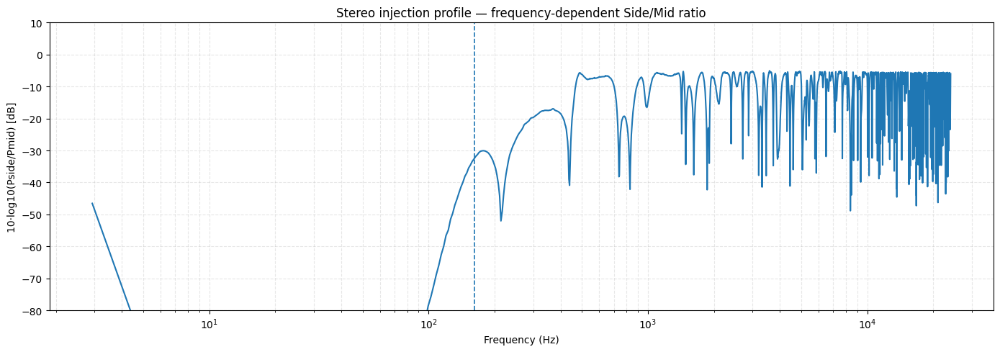

## Comparative listening

**Input (mono mixdown)**

**Premaster (stereo)**

In [7]:
#@title Stereo Synthesis (mono-safe, transient-safe)

import os, re, json, warnings
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
from scipy import signal
from scipy.signal import resample_poly
from IPython.display import display, Markdown, Audio

warnings.filterwarnings("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

# ============================================================
# User parameters
# ============================================================
INPUT_PATH = "/content/audiosr_0.wav"      # @param {"type":"string"}
OUTPUT_PATH = "/content/premaster_0.wav"   # @param {"type":"string"}
STEREO_INTENSITY = 0.55  # @param {"type":"slider", "min":0.0, "max":1.0, "step":0.05}

# ============================================================
# Helpers
# ============================================================
EPS = 1e-12

def _extract_tag(path: str) -> str:
    base = os.path.basename(path)
    m = re.search(r"_(\d+)(?=\.[Ww][Aa][Vv]$)", base)
    return f"_{m.group(1)}" if m else ""

def _sanitize(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x, dtype=np.float32)
    return np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0).astype(np.float32, copy=False)

def _db_to_lin(db: float) -> float:
    return float(10.0 ** (float(db) / 20.0))

def _lin_to_db(x: float) -> float:
    return float(20.0 * np.log10(max(float(x), EPS)))

def _resample_to(x: np.ndarray, orig_sr: int, target_sr: int) -> np.ndarray:
    x = _sanitize(x)
    if int(orig_sr) == int(target_sr):
        return x
    g = int(np.gcd(int(orig_sr), int(target_sr)))
    up = int(target_sr // g)
    down = int(orig_sr // g)
    y = resample_poly(x, up, down, window=("kaiser", 8.0), axis=0)
    return _sanitize(y)

def _safe_sosfiltfilt(sos, x):
    x = _sanitize(x)
    try:
        if x.shape[0] < 256:
            return signal.sosfilt(sos, x, axis=0).astype(np.float32)
        return signal.sosfiltfilt(sos, x, axis=0).astype(np.float32)
    except Exception:
        return signal.sosfilt(sos, x, axis=0).astype(np.float32)

def _onset_envelope(x: np.ndarray, sr: int, frame: int = 1024, hop: int = 256) -> np.ndarray:
    x = x.astype(np.float32, copy=False)
    n = len(x)
    if n < frame + 2:
        return np.zeros(n, dtype=np.float32)

    n_frames = 1 + (n - frame) // hop
    E = np.empty(n_frames, dtype=np.float32)
    for i in range(n_frames):
        a = i * hop
        seg = x[a:a+frame]
        E[i] = float(np.sum(seg * seg))

    d = np.maximum(0.0, np.diff(E, prepend=E[0]))
    d = d / (np.max(d) + EPS)

    env = np.repeat(d, hop).astype(np.float32)
    env = np.pad(env, (0, max(0, n - len(env))), mode="edge")[:n]

    b, a = signal.butter(2, 10.0, btype="lowpass", fs=sr)
    env = signal.filtfilt(b, a, env).astype(np.float32)
    return np.clip(env, 0.0, 1.0)

def _delay_samples(x: np.ndarray, d: int) -> np.ndarray:
    d = int(max(0, d))
    if d == 0:
        return x
    y = np.empty_like(x)
    y[:d] = 0.0
    y[d:] = x[:-d]
    return y

def _schroeder_allpass(x: np.ndarray, d: int, g: float) -> np.ndarray:
    d = int(d)
    if d < 1:
        return x.astype(np.float32, copy=False)
    g = float(np.clip(g, -0.95, 0.95))

    b = np.zeros(d + 1, dtype=np.float32)
    a = np.zeros(d + 1, dtype=np.float32)
    b[0] = -g; b[-1] = 1.0
    a[0] =  1.0; a[-1] = -g

    x0 = float(x[0]) if len(x) else 0.0
    zi = signal.lfilter_zi(b, a).astype(np.float32) * x0
    y, _ = signal.lfilter(b, a, x.astype(np.float32, copy=False), zi=zi)
    return y.astype(np.float32, copy=False)

def _allpass_cascade(x: np.ndarray, sr: int, sections: int, seed: int) -> np.ndarray:
    rng = np.random.default_rng(int(seed))
    y = x.astype(np.float32, copy=False)
    for _ in range(int(sections)):
        delay_ms = float(rng.uniform(0.6, 2.2))
        d = int(round(delay_ms * 1e-3 * sr))
        g = float(rng.uniform(0.35, 0.75))
        y = _schroeder_allpass(y, d, g)
    return y

def _welch_rms_band(x: np.ndarray, sr: int, f_lo: float, f_hi: float) -> float:
    x = x.astype(np.float32, copy=False)
    nperseg = min(16384, len(x))
    if nperseg < 512:
        return 0.0
    f, Pxx = signal.welch(x, fs=sr, nperseg=nperseg)
    band = (f >= f_lo) & (f <= f_hi)
    if not np.any(band):
        return 0.0
    p = float(np.trapz(Pxx[band], f[band]))
    return float(np.sqrt(max(p, 0.0)))

def _corrcoef_safe(a: np.ndarray, b: np.ndarray) -> float:
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    if a.size != b.size or a.size < 2:
        return 1.0
    a = a - float(np.mean(a))
    b = b - float(np.mean(b))
    da = float(np.dot(a, a))
    db = float(np.dot(b, b))
    denom = float(np.sqrt(da * db))
    if denom <= 1e-24:
        return 1.0
    c = float(np.dot(a, b) / denom)
    if not np.isfinite(c):
        return 1.0
    return float(np.clip(c, -1.0, 1.0))

def _min_corr_1s(L: np.ndarray, R: np.ndarray, sr: int) -> float:
    win = int(sr)
    n = int(min(len(L), len(R)))
    if n < win:
        if n < 16:
            return 1.0
        return _corrcoef_safe(L[:n], R[:n])

    m = 1.0
    for i in range(0, n - win + 1, win):
        c = _corrcoef_safe(L[i:i+win], R[i:i+win])
        m = min(m, c)
    return float(m)

def _apply_fade_lr(x: np.ndarray, sr: int, fade_ms: float = 8.0) -> np.ndarray:
    n = x.shape[0]
    f = int(round((fade_ms / 1000.0) * sr))
    if f < 2 or n < 4 * f:
        return x
    w = np.linspace(0.0, 1.0, f, dtype=np.float32)
    y = x.copy()
    y[:f, :] *= w[:, None]
    y[-f:, :] *= w[::-1][:, None]
    return y

# ============================================================
# Setup
# ============================================================
if not os.path.exists(INPUT_PATH):
    raise FileNotFoundError(f"Input file not found: {INPUT_PATH}")

TAG = _extract_tag(OUTPUT_PATH) or _extract_tag(INPUT_PATH)
PROFILE_PATH = f"/content/ai_profile{TAG}.json"
META_PATH = f"/content/stereo_meta{TAG}.json"

display(Markdown(r"""
# Stereo synthesis (mono-safe, transient-safe)

Design:
- Mid is the mono reference; stereo is injected only via Side.
- Side is high-passed (bass-safe) and decorrelated (all-pass diffusion + micro-delay).
- Transients are damped in the Side to keep attacks centered.
- Side level is chosen as the maximum value that satisfies guardrails.

"""))

# ============================================================
# Load & standardize
# ============================================================
x_in, sr_in = sf.read(INPUT_PATH, always_2d=True)
x_in = _sanitize(x_in)

TARGET_SR = 48000
x = _resample_to(x_in, int(sr_in), TARGET_SR)
sr = TARGET_SR

if x.ndim != 2 or x.shape[0] < max(1024, int(0.25 * sr)):
    raise ValueError("Invalid audio shape or too short.")
ch = int(x.shape[1])

# ============================================================
# Read style_profile (supports both keys)
# ============================================================
style_profile = "general"
if os.path.exists(PROFILE_PATH):
    try:
        with open(PROFILE_PATH, "r", encoding="utf-8") as f:
            prof = json.load(f)
        if isinstance(prof, dict):
            style_profile = str(prof.get("style_profile", prof.get("macro_profile", "general")))
    except Exception:
        style_profile = "general"

# ============================================================
# Stereo synthesis
# ============================================================
if ch >= 2:
    stereo = x[:, :2].astype(np.float32, copy=False)
    mode = "bypass_input_already_stereo"
    diagnostics = {"note": "input already stereo; no synthesis applied"}
else:
    mono = _sanitize(x[:, 0])
    inten = float(np.clip(STEREO_INTENSITY, 0.0, 1.0))

    mid_rms = float(np.sqrt(np.mean(mono * mono) + EPS))
    if mid_rms < 1e-6:
        raise RuntimeError("Input is near-silent; stereo synthesis is not defined for degenerate signals.")

    fc = float(190.0 - 70.0 * inten)
    if style_profile in ["hiphop", "pop"]:
        fc += 10.0
    fc = float(np.clip(fc, 120.0, 240.0))

    sos_hp = signal.butter(4, fc, btype="highpass", fs=sr, output="sos")
    side_src = _safe_sosfiltfilt(sos_hp, mono)

    env = _onset_envelope(mono, sr)
    transient_damp = float(0.30 + 0.35 * inten)
    w = np.clip(1.0 - transient_damp * env, 0.0, 1.0).astype(np.float32)

    sections = int(3 + round(3.0 * inten))
    seed0 = 1337

    a = _allpass_cascade(side_src, sr, sections=sections, seed=seed0)
    b = _allpass_cascade(side_src, sr, sections=sections, seed=seed0 + 777)

    d_samp = int(round((0.35 + 0.45 * inten) * 1e-3 * sr))
    b = _delay_samples(b, d_samp)

    side = 0.5 * (a - b)
    side = _safe_sosfiltfilt(sos_hp, (side * w).astype(np.float32, copy=False))

    side_rms = float(np.sqrt(np.mean(side * side) + EPS))
    if side_rms < 1e-8:
        raise RuntimeError("Input does not provide usable Side content after processing (degenerate).")

    style_bias_db = 0.0
    if style_profile in ["electronic", "ambient"]:
        style_bias_db = +1.5
    elif style_profile in ["classical", "jazz", "acoustic"]:
        style_bias_db = -1.5

    target_rel_db = float((-30.0 + 12.0 * inten) + style_bias_db)
    g0 = (mid_rms * _db_to_lin(target_rel_db)) / side_rms
    g0 = float(np.clip(g0, 0.0, 3.0))
    side = (side * g0).astype(np.float32, copy=False)

    mono_peak = float(np.max(np.abs(mono))) + EPS

    LOW_REL_MAX_DB = -28.0
    MIN_CORR_1S = -0.10
    PEAK_RATIO_MAX = 1.25

    m20_150 = _welch_rms_band(mono, sr, 20.0, 150.0)
    low_ref = max(m20_150, mid_rms * 1e-3, 1e-6)

    def _metrics_for(scale: float):
        s = (side * float(scale)).astype(np.float32, copy=False)
        L = (mono + s).astype(np.float32, copy=False)
        R = (mono - s).astype(np.float32, copy=False)

        s20_150 = _welch_rms_band(s, sr, 20.0, 150.0)
        rel_low_db = _lin_to_db((s20_150 + EPS) / (low_ref + EPS))

        corr_min = _min_corr_1s(L, R, sr)

        peak_lr = float(np.max(np.abs(np.stack([L, R], axis=1))))
        peak_ratio = float(peak_lr / mono_peak)

        s2_16k = _welch_rms_band(s, sr, 2000.0, min(16000.0, sr/2 - 200.0))
        width_score_db = _lin_to_db(s2_16k + EPS)

        ok = (rel_low_db <= LOW_REL_MAX_DB) and (corr_min >= MIN_CORR_1S) and (peak_ratio <= PEAK_RATIO_MAX)
        return ok, rel_low_db, corr_min, peak_ratio, width_score_db

    best_scale = 0.0
    best_metrics = None
    for sc in np.linspace(1.0, 0.0, 101):
        ok, rel_low_db, corr_min, peak_ratio, width_score_db = _metrics_for(float(sc))
        if ok:
            best_scale = float(sc)
            best_metrics = (rel_low_db, corr_min, peak_ratio, width_score_db)
            break

    if best_metrics is None:
        raise RuntimeError("Constraint system inconsistent (unexpected).")

    rel_low_db, corr_min, peak_ratio, width_score_db = best_metrics

    s_final = (side * best_scale).astype(np.float32, copy=False)
    L = (mono + s_final).astype(np.float32, copy=False)
    R = (mono - s_final).astype(np.float32, copy=False)
    stereo = np.stack([L, R], axis=1).astype(np.float32, copy=False)

    mode = "ms_mono_safe_allpass"
    diagnostics = {
        "style_profile": style_profile,
        "fc_hz": float(fc),
        "sections": int(sections),
        "delay_samples": int(d_samp),
        "side_gain_db_total": float(_lin_to_db(g0 * best_scale + EPS)),
        "rel_low_db_20_150": float(rel_low_db),
        "min_corr_1s": float(corr_min),
        "peak_ratio_lr_vs_mono": float(peak_ratio),
        "width_score_db": float(width_score_db),
        "scale_selected": float(best_scale),
    }

# ============================================================
# Premaster gain staging (peak headroom)
# ============================================================
stereo = _apply_fade_lr(stereo, sr, fade_ms=8.0)

peak_target_dbfs = -3.0
peak_target = _db_to_lin(peak_target_dbfs)

peak = float(np.max(np.abs(stereo)))
gain = float(peak_target / max(peak, EPS))
stereo_out = _sanitize(stereo * gain)

sf.write(OUTPUT_PATH, stereo_out, sr, subtype="FLOAT")

meta = {
    "input_path": str(INPUT_PATH),
    "output_path": str(OUTPUT_PATH),
    "tag": str(TAG),
    "sr_hz": int(sr),
    "mode": str(mode),
    "stereo_intensity": float(STEREO_INTENSITY),
    "premaster_peak_target_dbfs": float(peak_target_dbfs),
    "applied_gain_db": float(_lin_to_db(gain)),
    "diagnostics": diagnostics,
}
with open(META_PATH, "w", encoding="utf-8") as f:
    json.dump(meta, f, indent=2)

display(Markdown(
    f"✅ Premaster written: `{OUTPUT_PATH}`  \n"
    f"- Mode: `{mode}`  \n"
    f"- SR: `{sr}` Hz  \n"
    f"- Applied gain: `{meta['applied_gain_db']:.2f}` dB  \n"
    f"- Meta: `{META_PATH}`"
))

# ============================================================
# One diagnostic figure: Side/Mid ratio vs frequency
# ============================================================
if mode == "ms_mono_safe_allpass":
    mid = _sanitize(0.5 * (stereo_out[:, 0] + stereo_out[:, 1]))
    side_sig = _sanitize(0.5 * (stereo_out[:, 0] - stereo_out[:, 1]))

    f, Pm = signal.welch(mid, fs=sr, nperseg=min(16384, len(mid)))
    _, Ps = signal.welch(side_sig, fs=sr, nperseg=min(16384, len(side_sig)))
    ratio_db = 10.0 * np.log10((Ps + 1e-18) / (Pm + 1e-18))

    plt.figure(figsize=(14, 5))
    plt.semilogx(f[1:], ratio_db[1:])
    plt.axvline(float(meta["diagnostics"]["fc_hz"]), linestyle="--", linewidth=1.2)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("10·log10(Pside/Pmid) [dB]")
    plt.title("Stereo injection profile — frequency-dependent Side/Mid ratio")
    plt.grid(True, which="both", ls="--", alpha=0.3)
    plt.ylim(-80, 10)
    plt.tight_layout()
    plt.show()

# ============================================================
# Comparative listening
# ============================================================
display(Markdown("## Comparative listening"))
display(Markdown("**Input (mono mixdown)**"))
x0, sr0 = sf.read(INPUT_PATH, always_2d=True)
x0 = _sanitize(x0)
x0 = _resample_to(x0, int(sr0), sr)
m0 = _sanitize(np.mean(x0[:, :min(2, x0.shape[1])], axis=1))
display(Audio(m0, rate=sr))

display(Markdown("**Premaster (stereo)**"))
display(Audio(stereo_out.T, rate=sr))


# Mastering (platform target, two-pass loudnorm)

Preset: **Streaming (Spotify/YouTube/Deezer/TIDAL) — -14 LUFS, -1.0 dBTP**

Integrated loudness target: `-14.0` LUFS

True-peak ceiling: `-1.0` dBTP

LRA target: `11.0`

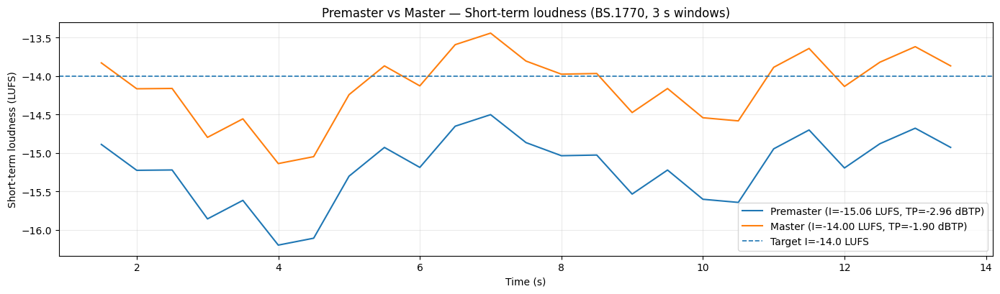

✅ Master written: `/content/master_0.wav`

Measured I: `-14.00` LUFS (target `-14.0`)

Measured TP: `-1.90` dBTP (ceiling `-1.0`)

## Comparative listening

**Premaster**

**Master**

In [8]:
#@title Mastering (platform target, two-pass loudnorm)

import os, sys, re, json, subprocess, warnings
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
from IPython.display import display, Markdown, Audio

warnings.filterwarnings("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

# ============================================================
# User parameters
# ============================================================
INPUT_PATH  = "/content/premaster_0.wav"  # @param {"type":"string"}
OUTPUT_PATH = "/content/master_0.wav"     # @param {"type":"string"}

PLATFORM = "Streaming (Spotify/YouTube/Deezer/TIDAL) — -14 LUFS, -1.0 dBTP"  # @param ["Streaming (Spotify/YouTube/Deezer/TIDAL) — -14 LUFS, -1.0 dBTP", "Apple Music — -16 LUFS, -1.0 dBTP", "Broadcast (EBU R128) — -23 LUFS, -1.0 dBTP", "Download (loud) — -9 LUFS, -0.8 dBTP"]

# ============================================================
# Presets
# ============================================================
TARGETS = {
    "Streaming (Spotify/YouTube/Deezer/TIDAL) — -14 LUFS, -1.0 dBTP": {"I": -14.0, "TP": -1.0, "LRA": 11.0, "linear": True},
    "Apple Music — -16 LUFS, -1.0 dBTP": {"I": -16.0, "TP": -1.0, "LRA": 11.0, "linear": True},
    "Broadcast (EBU R128) — -23 LUFS, -1.0 dBTP": {"I": -23.0, "TP": -1.0, "LRA": 7.0,  "linear": True},
    "Download (loud) — -9 LUFS, -0.8 dBTP": {"I": -9.0,  "TP": -0.8, "LRA": 9.0,  "linear": False},
}

# ============================================================
# Helpers
# ============================================================
EPS = 1e-12

def _run_capture(cmd):
    return subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

def _run_quiet(cmd, check=True):
    return subprocess.run(cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=check)

def _ensure_ffmpeg():
    try:
        subprocess.run(["ffmpeg", "-version"], stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=True)
    except Exception:
        _run_quiet(["apt-get", "update", "-y"], check=False)
        _run_quiet(["apt-get", "install", "-y", "ffmpeg"], check=False)
        subprocess.run(["ffmpeg", "-version"], stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=True)

def _ensure_ffmpeg_filters():
    p = _run_capture(["ffmpeg", "-hide_banner", "-filters"])
    txt = (p.stdout or "") + "\n" + (p.stderr or "")
    if " loudnorm " not in txt and "\nloudnorm" not in txt:
        raise RuntimeError("FFmpeg is present but the loudnorm filter is not available in this build.")

def _pip_quiet(pkgs):
    _run_quiet([sys.executable, "-m", "pip", "install", "-q"] + list(pkgs), check=True)

def _sanitize(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x, dtype=np.float32)
    return np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0).astype(np.float32, copy=False)

def _db_to_lin(db: float) -> float:
    return float(10.0 ** (float(db) / 20.0))

def _extract_last_balanced_json(text: str) -> dict:
    s = text or ""
    starts = [m.start() for m in re.finditer(r"\{", s)]
    if not starts:
        return {}
    for st in reversed(starts[-250:]):
        depth = 0
        ed = None
        for i in range(st, len(s)):
            c = s[i]
            if c == "{":
                depth += 1
            elif c == "}":
                depth -= 1
                if depth == 0:
                    ed = i
                    break
        if ed is None:
            continue
        blob = s[st:ed + 1]
        try:
            obj = json.loads(blob)
            if isinstance(obj, dict) and ("input_i" in obj) and ("input_tp" in obj):
                return obj
        except Exception:
            continue
    return {}

def _measure_loudnorm(path: str, I: float, TP: float, LRA: float) -> dict:
    cmd = [
        "ffmpeg", "-hide_banner", "-nostats", "-y", "-nostdin",
        "-i", path,
        "-af", f"loudnorm=I={I}:TP={TP}:LRA={LRA}:print_format=json",
        "-f", "null", "-"
    ]
    p = _run_capture(cmd)
    obj = _extract_last_balanced_json(p.stderr)
    if not obj:
        tail = (p.stderr or "")[-2200:]
        raise RuntimeError("FFmpeg loudnorm measurement failed.\n\n" + tail)
    return obj

def _as_float(x):
    try:
        v = float(x)
    except Exception:
        return np.nan
    return v

def _short_term_curve_bs1770(x: np.ndarray, sr: int, win_s: float = 3.0, hop_s: float = 0.5):
    import pyloudnorm as pyln
    meter = pyln.Meter(sr)
    w = int(round(win_s * sr))
    h = max(1, int(round(hop_s * sr)))
    if x.shape[0] < w:
        t = np.array([0.5 * x.shape[0] / sr], dtype=np.float32)
        v = np.array([float(meter.integrated_loudness(x))], dtype=np.float32)
        return t, v
    t, v = [], []
    for s in range(0, x.shape[0] - w + 1, h):
        seg = x[s:s + w, :]
        t.append((s + 0.5 * w) / sr)
        v.append(float(meter.integrated_loudness(seg)))
    return np.asarray(t, dtype=np.float32), np.asarray(v, dtype=np.float32)

# ============================================================
# Setup
# ============================================================
if not os.path.exists(INPUT_PATH):
    raise FileNotFoundError(f"Input file not found: {INPUT_PATH}")

_ensure_ffmpeg()
_ensure_ffmpeg_filters()

try:
    import pyloudnorm as pyln
except Exception:
    _pip_quiet(["pyloudnorm"])
    import pyloudnorm as pyln

preset = TARGETS.get(PLATFORM, TARGETS["Streaming (Spotify/YouTube/Deezer/TIDAL) — -14 LUFS, -1.0 dBTP"])
I   = float(preset["I"])
TP  = float(preset["TP"])
LRA = float(preset["LRA"])
LINEAR = bool(preset["linear"])

# Load premaster to lock SR/CH and for plot/players
pre, sr_pre = sf.read(INPUT_PATH, always_2d=True)
pre = _sanitize(pre)
sr_pre = int(sr_pre)
ch_pre = int(pre.shape[1])

if pre.shape[0] < max(1024, int(0.25 * sr_pre)):
    raise RuntimeError("Input is too short for reliable loudness measurement.")

display(Markdown(
    "# Mastering (platform target, two-pass loudnorm)\n\n"
    f"Preset: **{PLATFORM}**\n\n"
    f"Integrated loudness target: `{I:.1f}` LUFS\n\n"
    f"True-peak ceiling: `{TP:.1f}` dBTP\n\n"
    f"LRA target: `{LRA:.1f}`"
))

# ============================================================
# Measurement
# ============================================================
meas1 = _measure_loudnorm(INPUT_PATH, I, TP, LRA)
need = ["input_i", "input_tp", "input_lra", "input_thresh", "target_offset"]
if not all(k in meas1 for k in need):
    raise RuntimeError("FFmpeg loudnorm measurement JSON is incomplete.")

mI   = _as_float(meas1["input_i"])
mTP  = _as_float(meas1["input_tp"])
mLRA = _as_float(meas1["input_lra"])
mTH  = _as_float(meas1["input_thresh"])
mOFF = _as_float(meas1["target_offset"])

if not np.isfinite(mI) or not np.isfinite(mTP) or not np.isfinite(mLRA) or not np.isfinite(mTH) or not np.isfinite(mOFF):
    raise RuntimeError("Invalid loudness statistics (input may be near-silent or corrupted).")

# ============================================================
# Application (SR/CH locked)
# ============================================================
tmp_out = OUTPUT_PATH + ".tmp.wav"
linear_flag = "true" if LINEAR else "false"

afilter = (
    f"loudnorm=I={I}:TP={TP}:LRA={LRA}:"
    f"measured_I={mI:.6f}:"
    f"measured_TP={mTP:.6f}:"
    f"measured_LRA={mLRA:.6f}:"
    f"measured_thresh={mTH:.6f}:"
    f"offset={mOFF:.6f}:"
    f"linear={linear_flag},"
    f"aresample={sr_pre}"
)

cmd2 = [
    "ffmpeg", "-hide_banner", "-nostats", "-y", "-nostdin",
    "-i", INPUT_PATH,
    "-af", afilter,
    "-ac", str(ch_pre),
    "-ar", str(sr_pre),
    "-c:a", "pcm_f32le",
    tmp_out
]
p2 = _run_capture(cmd2)
if p2.returncode != 0 or not os.path.exists(tmp_out):
    tail = (p2.stderr or "")[-2200:]
    raise RuntimeError("FFmpeg loudnorm apply pass failed.\n\n" + tail)

mst, sr_mst = sf.read(tmp_out, always_2d=True)
mst = _sanitize(mst)
sr_mst = int(sr_mst)

if sr_mst != sr_pre:
    raise RuntimeError(f"Sample-rate mismatch after mastering: premaster {sr_pre} Hz, master {sr_mst} Hz")
if int(mst.shape[1]) != ch_pre:
    raise RuntimeError("Channel-count mismatch after mastering.")

# ============================================================
# Final trim (headroom-safe, gain only)
# ============================================================
meas2 = _measure_loudnorm(tmp_out, I, TP, LRA)
I_2  = _as_float(meas2.get("input_i", np.nan))
TP_2 = _as_float(meas2.get("input_tp", np.nan))
if not np.isfinite(I_2) or not np.isfinite(TP_2):
    raise RuntimeError("Master verification failed (invalid loudness stats).")

delta_db = float(I - I_2)
headroom_db = float(TP - TP_2)

apply_db = 0.0
if abs(delta_db) >= 0.05:
    if delta_db <= 0.0:
        apply_db = delta_db  # attenuation is always safe
    else:
        # boost only if it remains under TP ceiling (safety margin 0.05 dB)
        max_boost = headroom_db - 0.05
        if max_boost > 0.0:
            apply_db = min(delta_db, max_boost)

if abs(apply_db) > 0.0:
    mst = _sanitize(mst * _db_to_lin(apply_db))

# write final output (replace tmp for cleanliness)
sf.write(OUTPUT_PATH, mst, sr_pre, subtype="FLOAT")
try:
    os.remove(tmp_out)
except Exception:
    pass

meas_f = _measure_loudnorm(OUTPUT_PATH, I, TP, LRA)
I_final  = _as_float(meas_f.get("input_i", np.nan))
TP_final = _as_float(meas_f.get("input_tp", np.nan))

# ============================================================
# Plot: short-term loudness (3 s windows)
# ============================================================
t_pre, st_pre = _short_term_curve_bs1770(pre, sr_pre, win_s=3.0, hop_s=0.5)
t_mst, st_mst = _short_term_curve_bs1770(mst, sr_pre, win_s=3.0, hop_s=0.5)

t = t_pre if t_pre.size >= t_mst.size else t_mst
st_pre_i = np.interp(t, t_pre, st_pre) if t_pre.size > 1 else np.full_like(t, st_pre[0])
st_mst_i = np.interp(t, t_mst, st_mst) if t_mst.size > 1 else np.full_like(t, st_mst[0])

plt.figure(figsize=(14, 4.2))
plt.plot(t, st_pre_i, label=f"Premaster (I={mI:.2f} LUFS, TP={mTP:.2f} dBTP)")
plt.plot(t, st_mst_i, label=f"Master (I={I_final:.2f} LUFS, TP={TP_final:.2f} dBTP)")
plt.axhline(I, linestyle="--", linewidth=1.2, label=f"Target I={I:.1f} LUFS")
plt.title("Premaster vs Master — Short-term loudness (BS.1770, 3 s windows)")
plt.xlabel("Time (s)")
plt.ylabel("Short-term loudness (LUFS)")
plt.grid(True, alpha=0.25)
plt.legend(loc="best")
plt.tight_layout()
plt.show()

# ============================================================
# Results + listening
# ============================================================
display(Markdown(
    f"✅ Master written: `{OUTPUT_PATH}`\n\n"
    f"Measured I: `{I_final:.2f}` LUFS (target `{I:.1f}`)\n\n"
    f"Measured TP: `{TP_final:.2f}` dBTP (ceiling `{TP:.1f}`)"
))

display(Markdown("## Comparative listening"))
display(Markdown("**Premaster**"))
display(Audio(pre.T, rate=sr_pre))
display(Markdown("**Master**"))
display(Audio(mst.T, rate=sr_pre))
